In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
def nearest_value(array,value):
    idx=(np.abs(array-value)).argmin()
    return idx

In [2]:
df = pd.read_csv("2016.csv",index_col=range(4),skiprows=range(4),header=0)
for i in range(2017,2031):
    a = pd.read_csv("{0}.csv".format(i),index_col=range(4),skiprows=range(4), header = 0)
    df = df.append(a)
df = df.astype('float64')


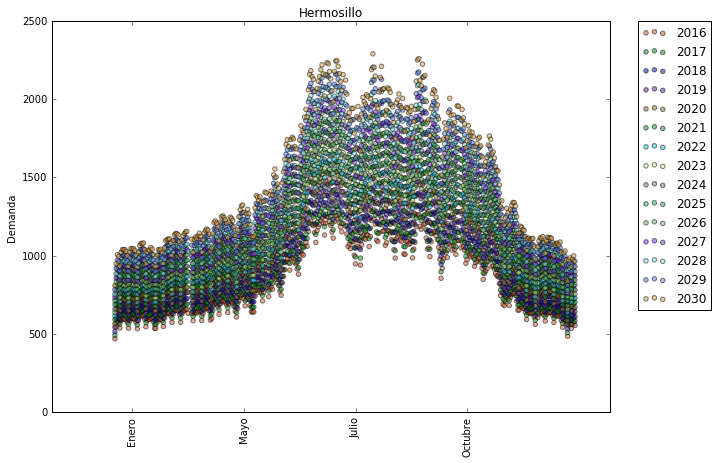

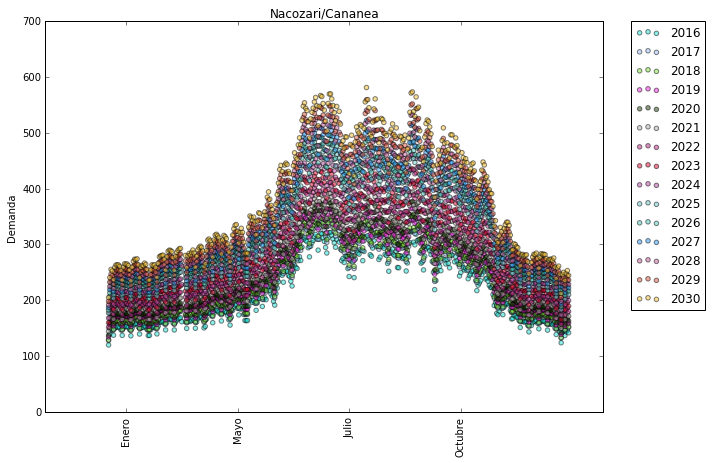

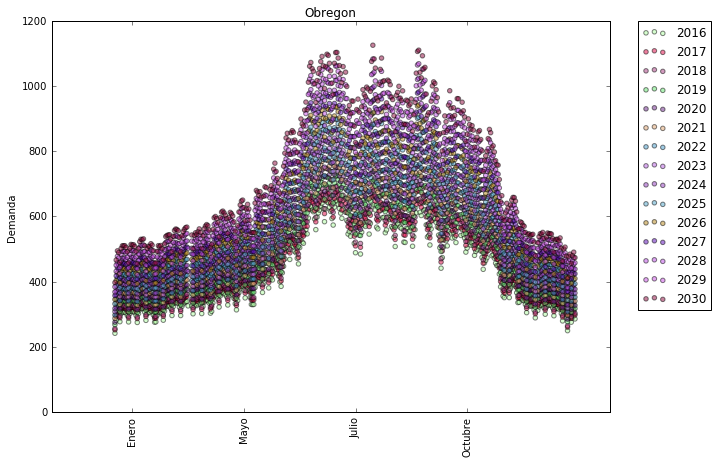

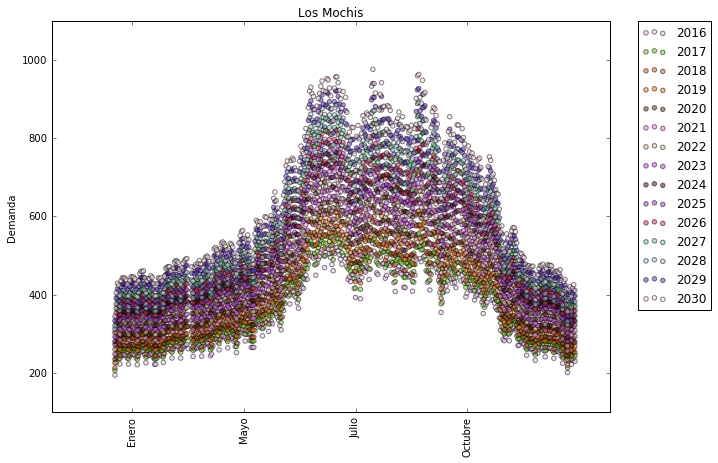

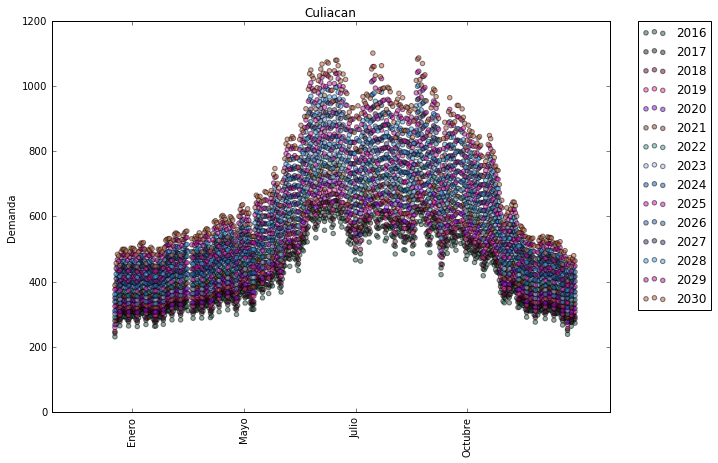

...

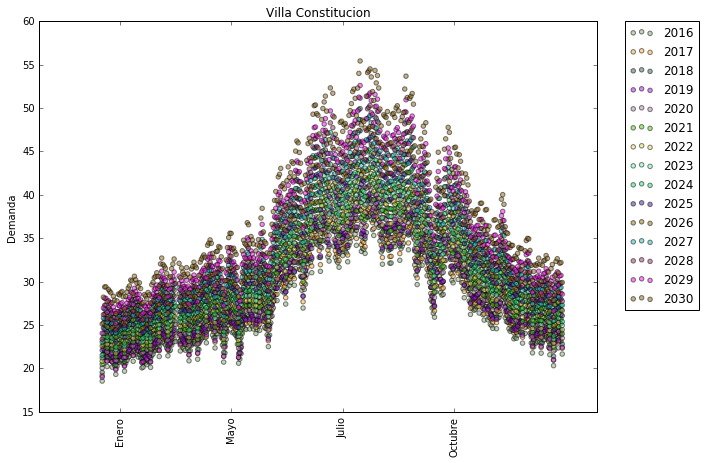

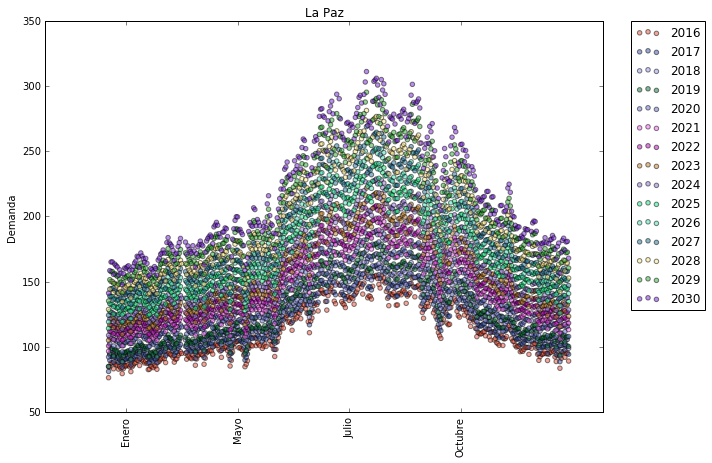

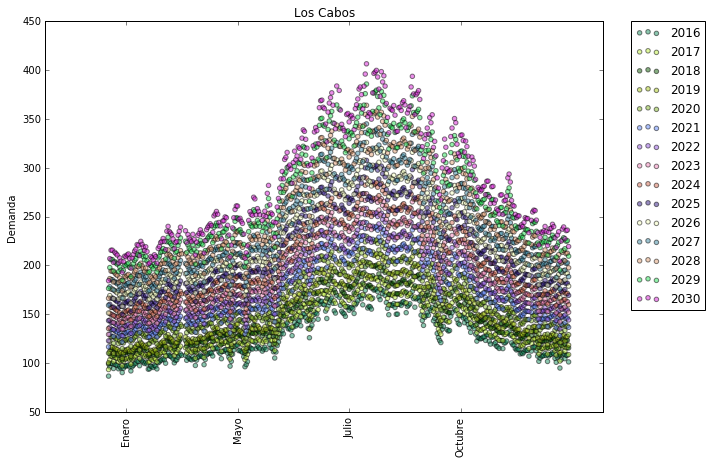

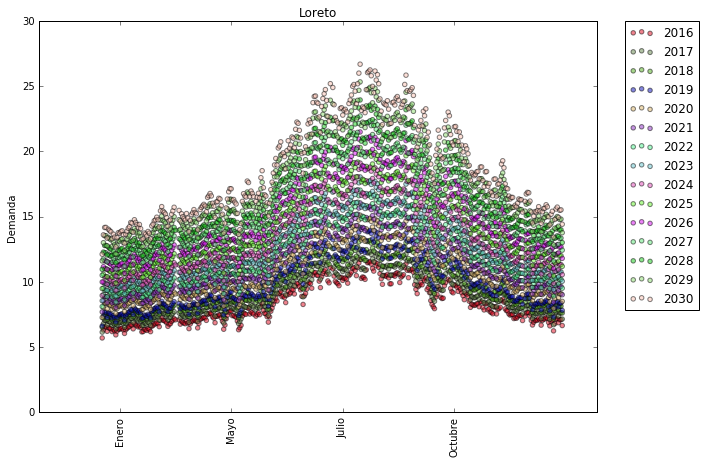

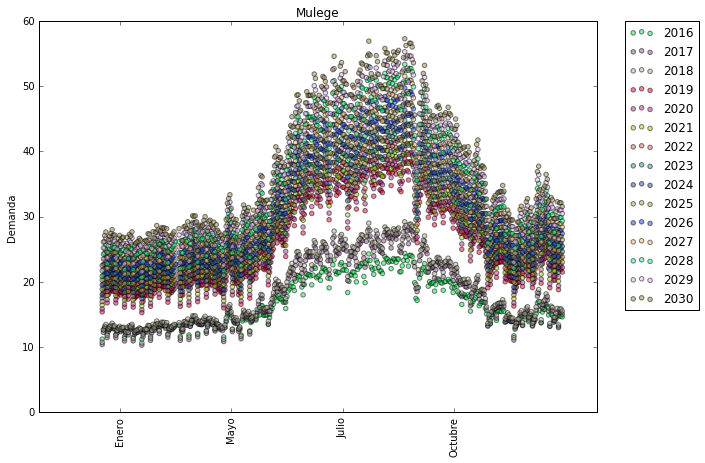

In [6]:
for index, k in enumerate(df.columns.tolist()):
    
    plt.figure(index,figsize=(10,7),dpi = 200)
    
    data1=[]
    for a in range(2016,2031):
        try: f=df.xs(a,level=0)[k]
        except ValueError: print "{0},{1},{2}".format(a,m,d)
        yy=[]
        for m in range(1,13):
            for d in range(1,32):
                try: yy.append(f.xs([m,d],level=[0,1]).mean())
                except KeyError: yy.append(0)
                
        
        color =[np.random.rand(3)]*372
        plt.scatter(range(1,373), yy, s=20, c=color, alpha=0.5,label='{0}'.format(a))
    plt.xticks([15,105,195,285], ['Enero','Mayo','Julio','Octubre'], rotation='vertical')
    name='Variación anual escenario medio en nodo {0}'.format(k)
    plt.ylabel('Demanda')
    plt.title(k)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()



In [7]:
columnas =[df.columns.tolist(),['DiaPico','ValorPico','PromedioMensual']]
col = pd.MultiIndex.from_product(columnas)
dfp=pd.DataFrame(index=pd.MultiIndex.from_tuples(df.xs([1,1],level=[2,3]).index.tolist()),columns=col)
for k in df.columns.tolist():
    for a in range(2016,2031):
        for m in range (1,13):
            promedio_dias =[] 
            for d in df.xs([a,m,1],level=[0,1,3])['Hermosillo'].index.tolist():
                promedio_dias.append(float(df.xs([a,m,d],level=range(3))[k].mean()))
            p=max(promedio_dias)
            dfp.xs([a,m])[k,'DiaPico']=promedio_dias.index(p)
            dfp.xs([a,m])[k,'ValorPico']=p
            dfp.xs([a,m])[k,'PromedioMensual']=(sum(promedio_dias)-p)/(len(promedio_dias)-1)

        Hermosillo                           Nacozari/Cananea            \
           DiaPico ValorPico PromedioMensual          DiaPico ValorPico   
2016 1          23   617.003         578.346               23   157.997   
     2          27   657.372         608.872               27   168.335   
     3          25   712.086         651.931               25   182.345   
     4          28   795.324         712.955               28    203.66   
     5          30   1085.16         898.869               30    277.88   
     6          24   1255.11         1187.74               24   321.398   
     7          22   1279.76         1107.13               22   327.712   
     8          28   1262.84         1100.67               28   323.377   
     9           0   1243.55         1061.61                0   318.438   
     10          1   1084.77         955.752                1    277.78   
     11          0   820.158         679.518                0    210.02   
     12          4   639.

In [ ]:
print "Analisis horario de un un nodo determinado. Dado un nodo, ano y mes, mostrara la demanda horaria diaria todos los dias en un grafico, mientras que en otro mostrara la demanda del dia pico, un dia promedio, el dia medio y un dia aleatorio"


k=raw_input("Planta: ")
a=int(raw_input("Ano: "))
m=int(raw_input("Mes: "))
res=int(raw_input("¿Cada cuantas horas quieres que grafique?  "))


%matplotlib inline
plt.figure(1,figsize=(10,8),dpi = 200)

for d in df.xs([a,m,1],level=[0,1,3])[k].index.tolist():
    yy=[]
    for h in range(1,25):
        yy.append(df.xs([a,m,d,h])[k])
    plt.scatter(range(1,25,res),[yy[i] for i in range(0,24,res)],s=40,c=[np.random.rand(3)]*24,alpha=.6,label='{0}'.format(d))
name='Variacion diaria {0} en {1},{2}'.format(k,a,m)
print dfp.xs([a, m])[k]
plt.ylabel('Demanda')
plt.title(name)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()



zz=[]
for d in df.xs([a,m,1],level=[0,1,3])[k].index.tolist():
    zz.append(df.xs([a,m,d],level=range(3))[k].mean())
aleatorio=random.choice(zz)
indx_ale=zz.index(aleatorio)
indx_mean= nearest_value(np.array(zz),dfp.xs([a,m])[k,'PromedioMensual'])
mean = zz[indx_mean]
if len(zz)%2 ==1:
    median = np.median(np.array(zz))
    indx_median = zz.index(median)
else:
    n=np.random.randint(len(zz))
    median = np.median(zz[-n])
    indx_median = zz.index(median)
    if indx_median>= n:
        indx_median= indx_median+1
        

plt.figure(2,figsize=(10,8),dpi = 200)
plt.scatter(range(1,25,res),[df.xs([a,m,indx_ale],level=range(3))[k].tolist()[i] for i in range(0,24,res)],s=80,c=[np.random.rand(3)]*24,alpha=.6,label="Aleatorio")
plt.scatter(range(1,25,res),[df.xs([a,m,indx_mean],level=range(3))[k].tolist()[i] for i in range(0,24,res)],s=80,c=[np.random.rand(3)]*24,alpha=.6,label="Promedio")
plt.scatter(range(1,25,res),[df.xs([a,m,indx_median],level=range(3))[k].tolist()[i] for i in range(0,24,res)],s=80,c=[np.random.rand(3)]*24,alpha=.6,label="Mediana")
plt.scatter(range(1,25,res),[df.xs([a,m,dfp.xs([a,m])[k,'DiaPico']],level=range(3))[k].tolist()[i] for i in range(0,24,res)],s=80,c=[np.random.rand(3)]*24,alpha=.6,label="Aleatorio")
plt.xlabel('Dia')
plt.ylabel('Demanda')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Dias significativos en nodo {0}, {1}/{2}'.format(k,m,a))
plt.show()